In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=20f1c2292904927f0537a4bf3c5c335eddadfd625351facfde2a9b766979e1d5
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv("continuous dataset.csv")

# Preprocessing

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48048 entries, 0 to 48047
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    48048 non-null  object 
 1   nat_demand  48048 non-null  float64
 2   T2M_toc     48048 non-null  float64
 3   QV2M_toc    48048 non-null  float64
 4   TQL_toc     48048 non-null  float64
 5   W2M_toc     48048 non-null  float64
 6   T2M_san     48048 non-null  float64
 7   QV2M_san    48048 non-null  float64
 8   TQL_san     48048 non-null  float64
 9   W2M_san     48048 non-null  float64
 10  T2M_dav     48048 non-null  float64
 11  QV2M_dav    48048 non-null  float64
 12  TQL_dav     48048 non-null  float64
 13  W2M_dav     48048 non-null  float64
 14  Holiday_ID  48048 non-null  int64  
 15  holiday     48048 non-null  int64  
 16  school      48048 non-null  int64  
dtypes: float64(13), int64(3), object(1)
memory usage: 6.2+ MB


In [ ]:
# Define additional markers for missing values
missing_markers = ["", "NA", "N/A", "NULL", "None", "nan"]  # Add any other markers as needed

# Check for missing values in the dataset
missing_values = data.isin(missing_markers).sum()
print("Missing values:\n", missing_values)

# Check if there are any missing values
if missing_values.sum() == 0:
    print("No missing values in the dataset.")
else:
    print("There are missing values in the dataset.")


Missing values:
 datetime      0
nat_demand    0
T2M_toc       0
QV2M_toc      0
TQL_toc       0
W2M_toc       0
T2M_san       0
QV2M_san      0
TQL_san       0
W2M_san       0
T2M_dav       0
QV2M_dav      0
TQL_dav       0
W2M_dav       0
Holiday_ID    0
holiday       0
school        0
dtype: int64
No missing values in the dataset.


In [ ]:
data.describe()

,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
count,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000,48048.000000
mean,1182.868647,27.399111,0.018313,0.079979,13.391049,26.921023,0.017844,0.106265,7.046675,24.719513,0.016867,0.144681,3.567589,0.704795,0.062937,0.727793
std,192.068896,1.675462,0.001607,0.065589,7.295502,3.018129,0.001889,0.086293,4.103711,2.414019,0.001584,0.087899,1.710522,3.147470,0.242852,0.445100
min,85.192500,22.953455,0.012054,0.000000,0.008979,19.765222,0.010247,0.000009,0.060394,19.933740,0.009655,0.000032,0.015497,0.000000,0.000000,0.000000
25%,1020.056900,26.160455,0.017236,0.026451,7.544958,24.769281,0.016584,0.036819,3.955051,22.954652,0.015800,0.075775,2.298887,0.000000,0.000000,0.000000
50%,1168.427700,27.118051,0.018590,0.065201,12.182103,26.167352,0.018351,0.085968,5.992762,24.001718,0.017167,0.130188,3.413994,0.000000,0.000000,1.000000
75%,1327.563950,28.558344,0.019521,0.117310,18.661282,28.712335,0.019242,0.157288,9.409871,26.243402,0.018067,0.200012,4.670628,0.000000,0.000000,1.000000
max,1754.882000,35.039575,0.022690,0.521240,39.229726,39.063440,0.022165,0.484985,24.483937,34.216211,0.021066,0.477783,10.288902,22.000000,1.000000,1.000000


# Correlation Analysis

In [ ]:
# Calculate correlation matrix
correlation_matrix = data.corr()

# Extract correlation with 'nat_demand' (assuming it's the target variable)
correlation_with_demand = correlation_matrix['nat_demand']

print("Correlation with 'nat_demand':")
print(correlation_with_demand)

Correlation with 'nat_demand':
nat_demand    1.000000
T2M_toc       0.652811
QV2M_toc     -0.036706
TQL_toc       0.073109
W2M_toc       0.098435
T2M_san       0.627024
QV2M_san      0.022172
TQL_san       0.119038
W2M_san       0.191796
T2M_dav       0.648279
QV2M_dav     -0.002117
TQL_dav       0.042037
W2M_dav      -0.054802
Holiday_ID   -0.129834
holiday      -0.165673
school        0.040044
Name: nat_demand, dtype: float64


<ipython-input-8-e08b012bbaf5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


In [21]:
import pandas as pd

# Load the dataset
data = pd.read_csv('continuous dataset.csv')

# Select relevant columns
variables = ['T2M_toc', 'QV2M_toc', 'TQL_toc', 'W2M_toc', 'T2M_san', 'QV2M_san', 'TQL_san', 'W2M_san', 'T2M_dav', 'QV2M_dav', 'TQL_dav', 'W2M_dav']
electricity_load = 'nat_demand'

# Calculate correlation matrix
correlation_matrix = data.corr()

# Print correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
            nat_demand   T2M_toc  QV2M_toc   TQL_toc   W2M_toc   T2M_san  \
nat_demand    1.000000  0.652811 -0.036706  0.073109  0.098435  0.627024   
T2M_toc       0.652811  1.000000 -0.012808  0.108872  0.051909  0.919992   
QV2M_toc     -0.036706 -0.012808  1.000000  0.413594 -0.539345 -0.213480   
TQL_toc       0.073109  0.108872  0.413594  1.000000 -0.373020  0.042989   
W2M_toc       0.098435  0.051909 -0.539345 -0.373020  1.000000  0.221042   
T2M_san       0.627024  0.919992 -0.213480  0.042989  0.221042  1.000000   
QV2M_san      0.022172  0.006596  0.867780  0.402671 -0.604814 -0.228587   
TQL_san       0.119038  0.148560  0.362050  0.606556 -0.461718  0.036498   
W2M_san       0.191796  0.169162 -0.515202 -0.153763  0.703369  0.257591   
T2M_dav       0.648279  0.915632 -0.181143  0.072130  0.182972  0.960456   
QV2M_dav     -0.002117 -0.006409  0.833848  0.343910 -0.603195 -0.217844   
TQL_dav       0.042037  0.012090  0.370708  0.483151 -0.420152 -0.09

<ipython-input-21-632466b752dc>:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


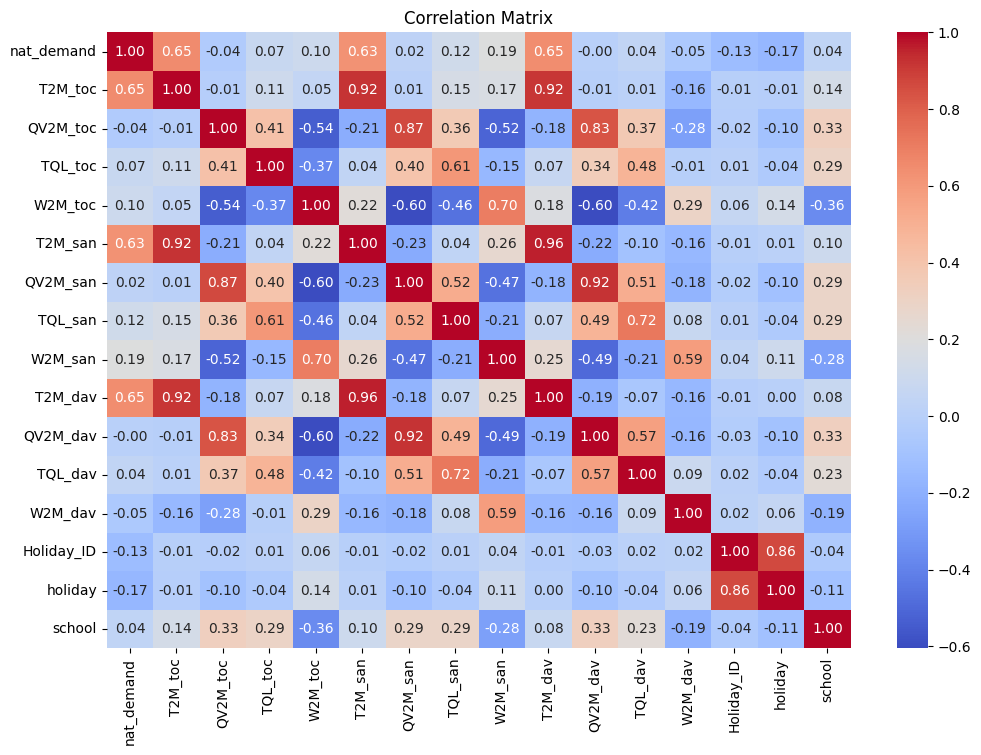

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('continuous dataset.csv')

# Select relevant columns
variables = ['T2M_toc', 'QV2M_toc', 'TQL_toc', 'W2M_toc', 'T2M_san', 'QV2M_san', 'TQL_san', 'W2M_san', 'T2M_dav', 'QV2M_dav', 'TQL_dav', 'W2M_dav']
electricity_load = 'nat_demand'


# Visualize the relationship using heatmaps (correlation matrix)
correlation_matrix = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


         nat_demand       T2M_toc      QV2M_toc       TQL_toc       W2M_toc  \
count  48048.000000  48048.000000  48048.000000  48048.000000  48048.000000   
mean    1182.868647     27.399111      0.018313      0.079979     13.391049   
std      192.068896      1.675462      0.001607      0.065589      7.295502   
min       85.192500     22.953455      0.012054      0.000000      0.008979   
25%     1020.056900     26.160455      0.017236      0.026451      7.544958   
50%     1168.427700     27.118051      0.018590      0.065201     12.182103   
75%     1327.563950     28.558344      0.019521      0.117310     18.661282   
max     1754.882000     35.039575      0.022690      0.521240     39.229726   

            T2M_san      QV2M_san       TQL_san       W2M_san       T2M_dav  \
count  48048.000000  48048.000000  48048.000000  48048.000000  48048.000000   
mean      26.921023      0.017844      0.106265      7.046675     24.719513   
std        3.018129      0.001889      0.086293    

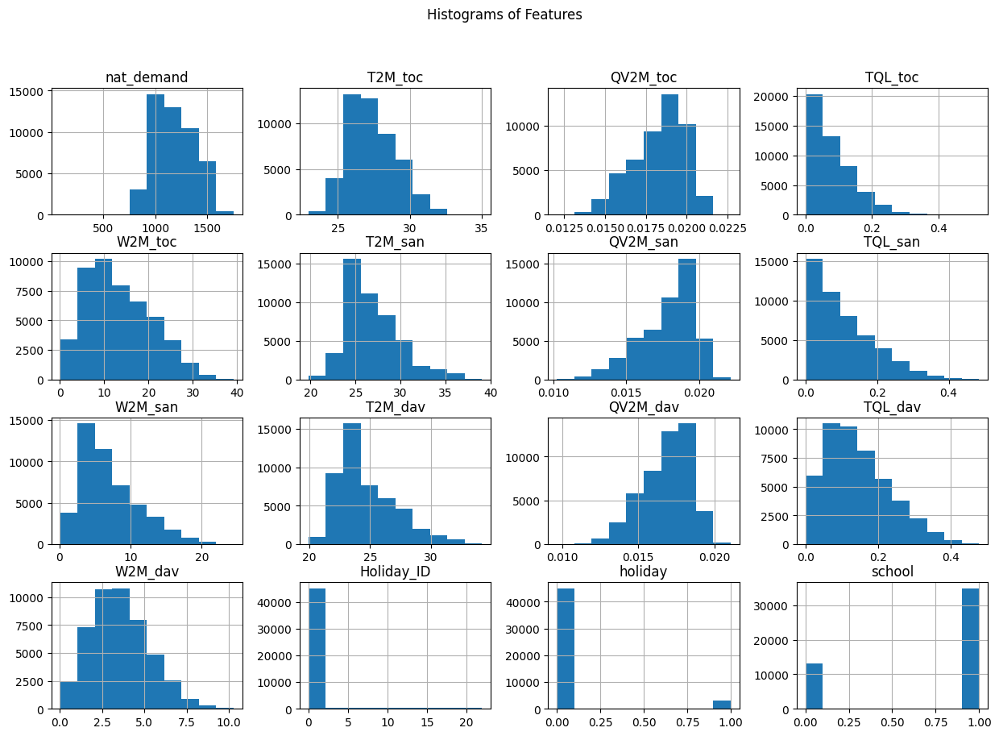

In [ ]:
# Load the dataset
data = pd.read_csv('continuous dataset.csv')

# Summary statistics
print(data.describe())

# Histograms of each feature
data.hist(figsize=(15, 10))
plt.suptitle('Histograms of Features')
plt.show()

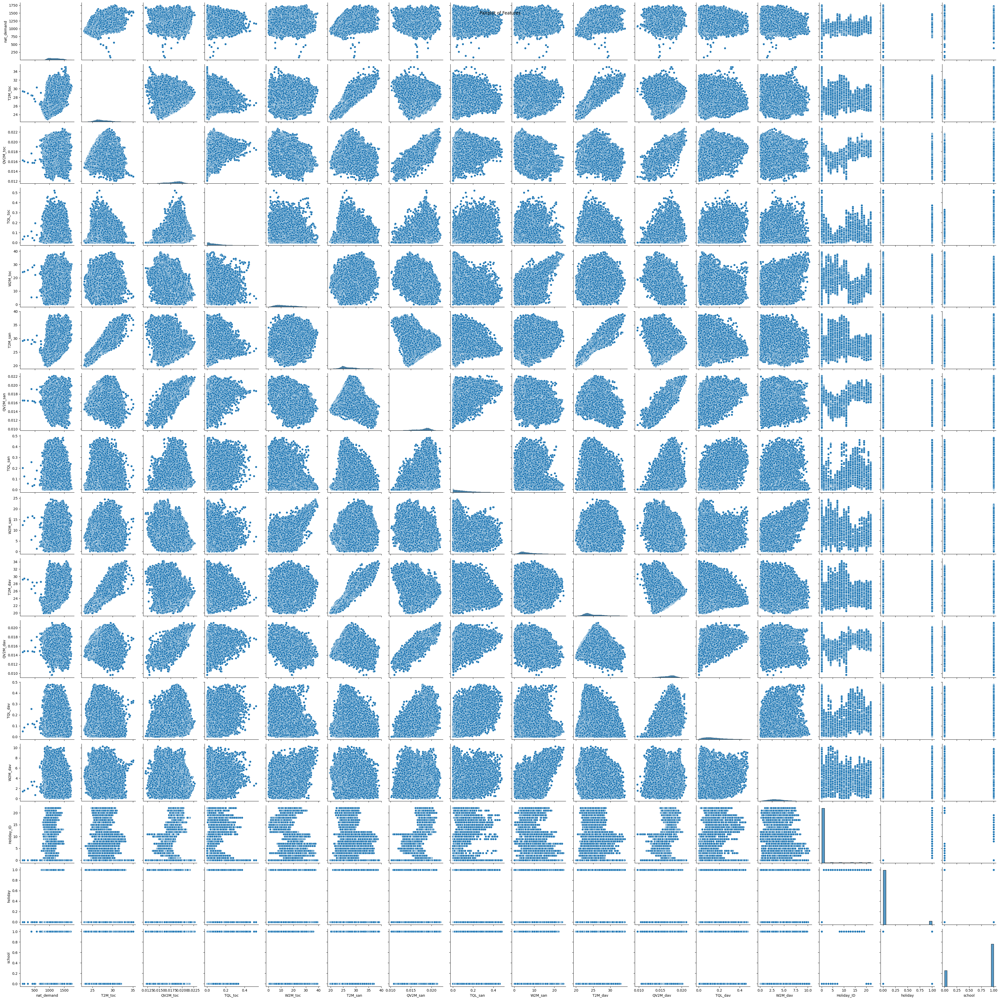

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('continuous dataset.csv')
# Pairplot to visualize relationships between features
sns.pairplot(data)
plt.suptitle('Pairplot of Features')
plt.show()

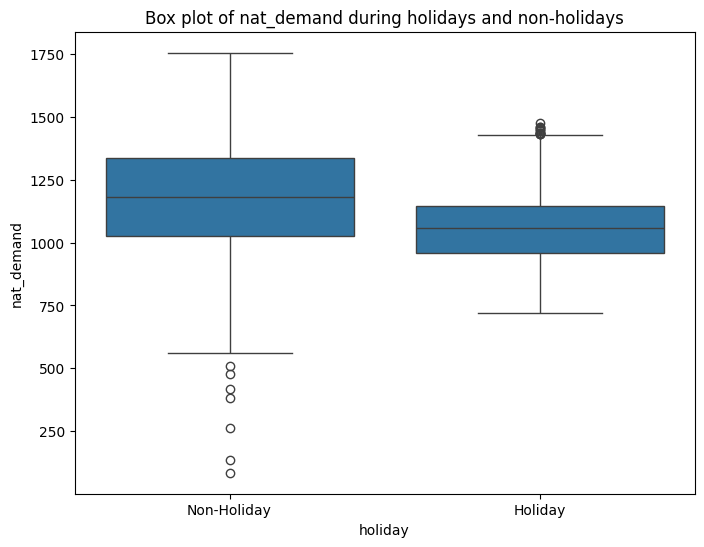

In [ ]:

# Box plot of nat_demand during holidays and non-holidays
plt.figure(figsize=(8, 6))
sns.boxplot(x='holiday', y='nat_demand', data=data)
plt.title('Box plot of nat_demand during holidays and non-holidays')
plt.xlabel('holiday')
plt.ylabel('nat_demand')
plt.xticks(ticks=[0, 1], labels=['Non-Holiday', 'Holiday'])
plt.show()

                            OLS Regression Results                            
Dep. Variable:             nat_demand   R-squared:                       0.431
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     9104.
Date:                Thu, 28 Mar 2024   Prob (F-statistic):               0.00
Time:                        06:30:47   Log-Likelihood:            -3.0725e+05
No. Observations:               48048   AIC:                         6.145e+05
Df Residuals:                   48043   BIC:                         6.146e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -878.3693     14.712    -59.703      0.0

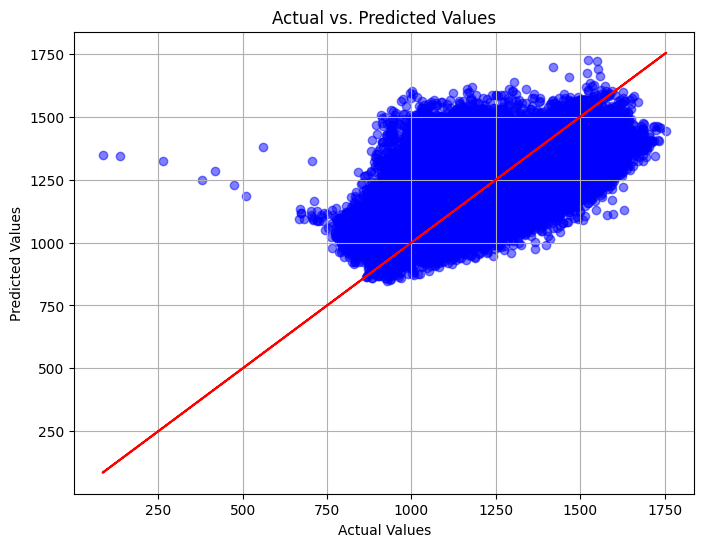

In [ ]:
# Prepare the data for regression
X = data[['T2M_toc', 'QV2M_toc', 'TQL_toc', 'W2M_toc']]  # Independent variables
y = data['nat_demand']  # Dependent variable (electricity demand)

# Add constant term to the independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

# Plotting the actual vs. predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y, model.fittedvalues, color='blue', alpha=0.5)
plt.plot(y, y, color='red')  # Diagonal line indicating perfect predictions
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()

                            OLS Regression Results                            
Dep. Variable:             nat_demand   R-squared:                       0.436
Model:                            OLS   Adj. R-squared:                  0.436
Method:                 Least Squares   F-statistic:                     9269.
Date:                Thu, 28 Mar 2024   Prob (F-statistic):               0.00
Time:                        06:31:31   Log-Likelihood:            -3.0706e+05
No. Observations:               48048   AIC:                         6.141e+05
Df Residuals:                   48043   BIC:                         6.142e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -383.4648     11.180    -34.300      0.0

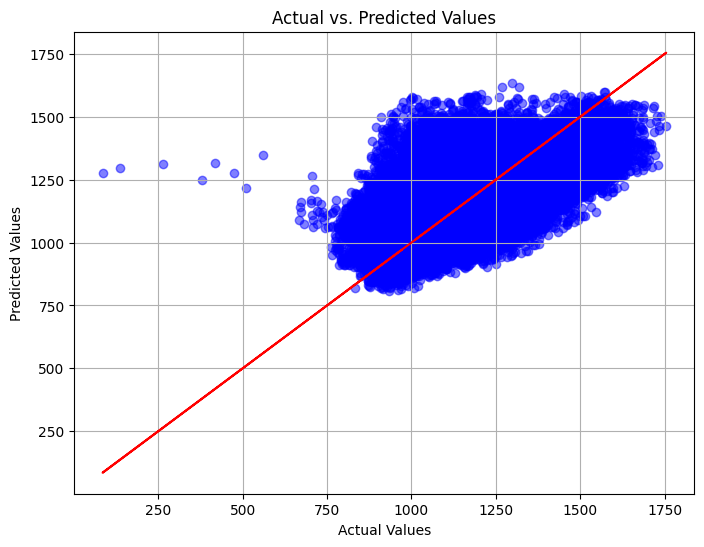

In [ ]:
# Prepare the data for regression
X = data[['T2M_san', 'QV2M_san', 'TQL_san', 'W2M_san']]  # Independent variables
y = data['nat_demand']  # Dependent variable (electricity demand)

# Add constant term to the independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

# Plotting the actual vs. predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y, model.fittedvalues, color='blue', alpha=0.5)
plt.plot(y, y, color='red')  # Diagonal line indicating perfect predictions
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()

                            OLS Regression Results                            
Dep. Variable:             nat_demand   R-squared:                       0.442
Model:                            OLS   Adj. R-squared:                  0.442
Method:                 Least Squares   F-statistic:                     9498.
Date:                Thu, 28 Mar 2024   Prob (F-statistic):               0.00
Time:                        06:32:02   Log-Likelihood:            -3.0681e+05
No. Observations:               48048   AIC:                         6.136e+05
Df Residuals:                   48043   BIC:                         6.137e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -490.5986     12.652    -38.777      0.0

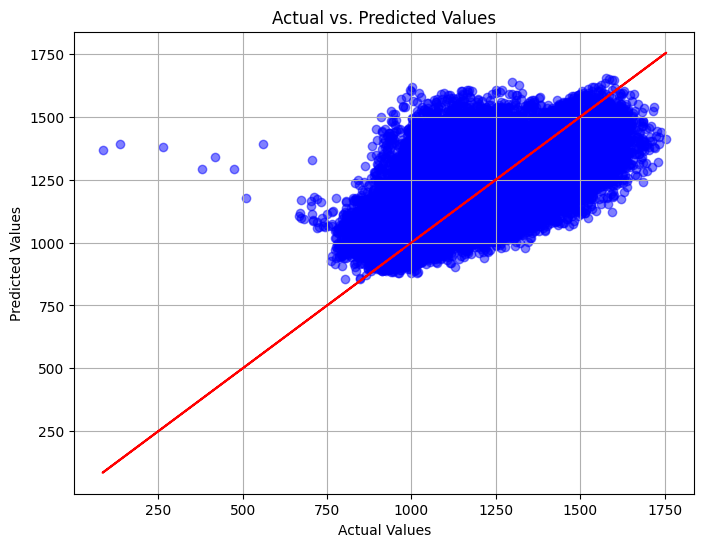

In [ ]:
# Prepare the data for regression
X = data[['T2M_dav', 'QV2M_dav', 'TQL_dav', 'W2M_dav']]  # Independent variables
y = data['nat_demand']  # Dependent variable (electricity demand)

# Add constant term to the independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

# Plotting the actual vs. predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y, model.fittedvalues, color='blue', alpha=0.5)
plt.plot(y, y, color='red')  # Diagonal line indicating perfect predictions
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()